# A simulation that targets a specific outcome

In normal model use, the trajectory of the exogenous variables determine the trajectory of the endogenous (left hand side) variables. However, sometimes  it can be useful to target a trajectory of some endogenous variables by calculating a trajectory of exogenous variables. That is the exogenous variables are a function of the endogenous variables. 

A simple example might be where a policy maker wanted to know what level of Carbon Tax implemented in a budget neutral fashion would be needed to achieve a specific level of emissions.  As specified, the analytical question is to achieve two targets: 

 1. A specific $CO^2$ emissions trajectory 
 2. An unchanged fiscal deficit 
 
**Targeting** also in `Modelflow` requires that there be **as many instruments as there are targets**. So in the above example two instruments would be required. 

The instrument to achieve the emissions could be a Carbon tax (applied uniformly on emissions from coal, gas and crude oil).  The instrument to achieve an unchanged fiscal deficit, could be government spending or another from of revenue, say taxes on labor.

This Notebook uses a  model for Pakistan described here: {cite:author}`burns_climate_2021`


To run the simulation, the following main steps must be undertaken

1. Load a model and data
2. Create an baseline 
3. Define instrument variables (one instrument can consist of several variables). 
4. Define a dataframe with the trajectory of the target variables.  
3. Solve the problem by using the `.invert` method. 
4. Visualize the results 


:::{index} single: Targeting
:::

 
 
## Preparing the work space  

As always before running a simulation, the various python classes that will be used must be imported.

In [2]:
# HIDDEN in jupyterbook 
#This is code to manage dependencies if the notebook is executed in the google colab cloud service
if 'google.colab' in str(get_ipython()):
  import os
  os.system('apt -qqq install graphviz')
  os.system('pip -qqq install ModelFlowIb ipysheet  --no-dependencies ')
  incolab = True  
else:
  incolab = False 

In [3]:
%matplotlib inline

In [4]:
from modelclass import model 

model.widescreen()
model.scroll_off()

<IPython.core.display.Javascript object>

## Load a  model, data and descriptions 
The file `pak.pcim` contains a dump of model equations, dataframe, simulation options and variable descriptions. The file has been created when onboarding the model. The onboarding process is described [here.](../../onboard/eviews/onboard%20one%20model%20from%20%20wf1.html#onboard-a-model-defined-in-a-wf1-file)

In [5]:
mpak,initial = model.modelload('data/pak.pcim')

file read:  C:\modelflow manual repo\wb-repos\pak\data\pak.pcim


## Solve the model to create a baseline

In [6]:
baseline = mpak(initial,2022,2100,alfa=0.7,silent=1,ljit=True)
mpak.basedf = baseline.copy()

Compile prolog: 100%|███████████████████████████████████████████████████████████████████████████| 1/1  2.99s/code chunk
Compile core  : 100%|███████████████████████████████████████████████████████████████████████████| 4/4  2.42s/code chunk
Compile epilog: 100%|███████████████████████████████████████████████████████████████████████████| 9/9  2.03s/code chunk


## Target CO2 emission - a  very simple example
The first and very simple example only the emission is targeted - in this case - an just to keep the example simple - the 
target is to keep the a yearly growth of emission rate at 1 percent. 

### Define targets

```{index} single: Goal Seeking; Defining Targets 
```
```{index} single: Targeting a result; Defining Targets
```


In [7]:
# Create dataframe with only the target variable 
target_before_simple = baseline.loc[2024:2100,['PAKCCEMISCO2TKN']]    

# create a target dataframe with a projection of the target variable 
target_simple = target_before_simple.upd(f'<2025 2100> PAKCCEMISCO2TKN =growth 1')

```{index} single: Goal Seeking; Defining Instruments
```
```{index} single: Targeting a result; Defining Instruments
```

### Define instruments 

In [8]:
instruments_simple = [['PAKGGREVCO2CER','PAKGGREVCO2GER', 'PAKGGREVCO2OER']]


```{index} single: Goal Seeking; solve for instruments
```
```{index} single: Targeting a result; solve for Instruments
```

### Find the instruments 

In [9]:
_ = mpak.invert(baseline,                  # Invert calls the target instrument device                   
                targets = target_simple,                   
                instruments=instruments_simple,
                
                DefaultImpuls=20,      # The default impulse instrument variables 
                defaultconv=2000.0,    # Convergergence criteria for targets
                varimpulse=False,      # Changes in instruments in each iteration are carried over to the future
                nonlin=3,              # If no convergence in 15 iteration recalculate jacobi 
                silent=1,              # Don't show iteration output (try 1 for showing)
                maxiter = 3000,
                progressbar = True)


Finding instruments :   0%|          | 0/77

### Display result

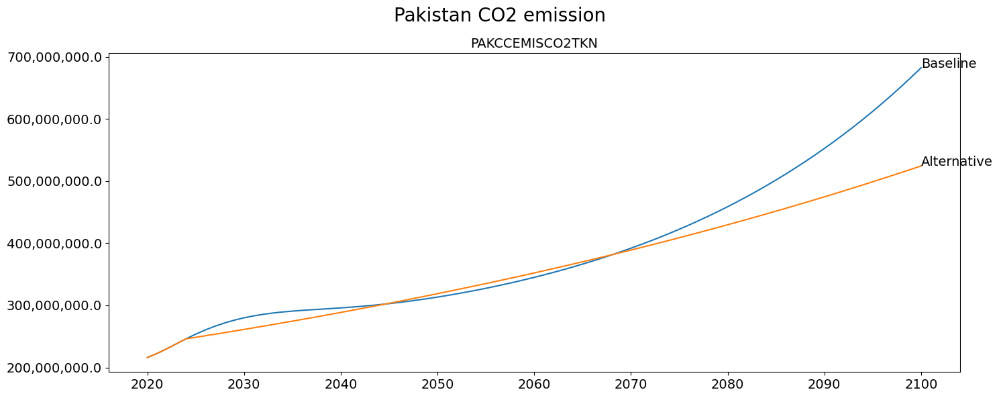

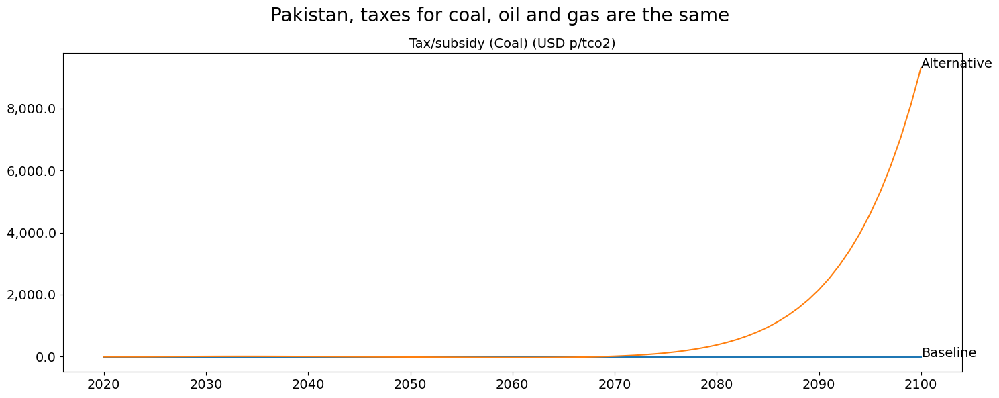

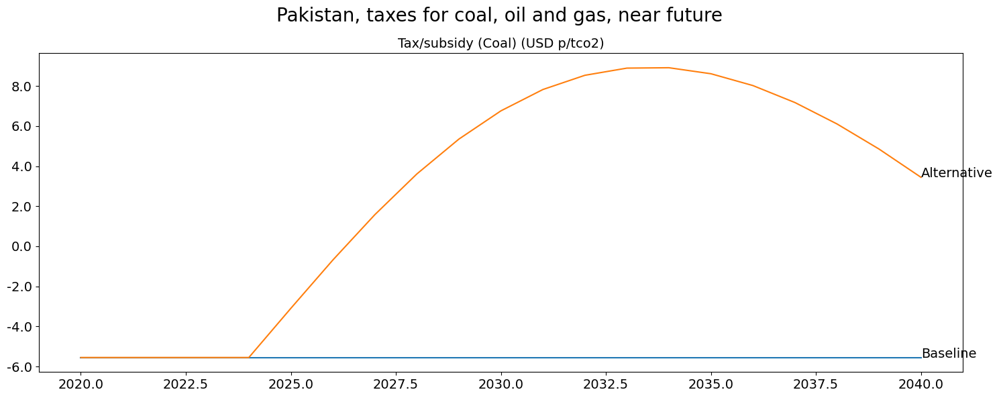

In [10]:
with mpak.set_smpl(2020,2100):    # change if you want another  timeframe 
    fig = mpak[f'PAKCCEMISCO2TKN' ].plot_alt(title='Pakistan CO2 emission') 
    fig2 = mpak[f'PAKGGREVCO2CER' ].plot_alt(title=f'Pakistan, taxes for coal, oil and gas are the same'); 
    
with mpak.set_smpl(2020,2040):    # for the near future. 
    fig2 = mpak[f'PAKGGREVCO2CER' ].plot_alt(title=f'Pakistan, taxes for coal, oil and gas, near future');     

## Targeting carbon emissions in a budget neutral manner
 



 
In the example below the two instruments are the:
 
 1. Carbon emission tax, which is covered by 3 variables 
 2. Government capital expenditure


## Target CO2 emission and government deficit by adjusting carbon tax and government expenditure. 

 This example  has two targets. 
 1. To reduce carbon emissions by 40% by 2050 and then hold them at that level. The instrument to be employed will be a Carbon tax.  
 2. To keep the government budget remains unchanged.  
 
 The instrument to be used is:
 1. Carbon tax which is covered by 3 variables
 2. Government spending on goods and services, implying that revenues from the Carbon Taxes will be used to increase government services.  
 
Both instruments impact both targets.  

{cite:author}`burns_climate_2021` using the same model explores the macroeconomic consequences implications of alternative uses of the revenues from the Carbon Tax.



### Define target trajectory for CO2 emission. 
The objective is to reduce Carbon emissions by 75% (as compared with the baseline) by the year 2050 and hold them constant in level terms afterwards.  

:::{admonition} Experiment with the result 
:class: tip
By changing the two variables below the user can experiment with the impact of different emission targets and different years in which the target 
should be fulfilled
:::


In [11]:
reduction_percent = 40  # Input the desired reduction in percent. 
achieved_by       = 2050

To implement this, one must:


 1. Calculate the target emission in the target  year (achived_by) = $PAKCCEMISCO2TKN_{achieved\_by} (1-reduction\_percent/100)$ 
 2. Calculate the yearly growth rate of the target variable needed to reach that level=<br> 
    $\dfrac{Target_{achieved\_by}}{PAKCCEMISCO2TKN_{2024}}^{\dfrac{1}{achieved\_by-2024}}-1$
 3. Calculate target values for emission in each year and then hold them constant from target year  through 2100




In [12]:
bau_achieved_by     = baseline.loc[achieved_by,'PAKCCEMISCO2TKN']
bau_2024            = baseline.loc[2024,'PAKCCEMISCO2TKN']

target_achieved_by  = bau_achieved_by*(1-reduction_percent/100)


target_growth_rate  = (target_achieved_by/bau_2024)**(1/(achieved_by-2024))-1
bau_growth_rate     = (bau_achieved_by/bau_2024)**(1/(achieved_by-2024))-1

print(f"Business as usual Emission value in {achieved_by} : {bau_achieved_by:13,.0f} tons")
print(f"Target  Emission value in {achieved_by}           : {target_achieved_by:13,.0f} tons")
print(f"Business as usual growth rate in percent : {bau_growth_rate:13,.1%}")
print(f"Target growth rate in percent            : {target_growth_rate:13,.1%}")

Business as usual Emission value in 2050 :   313,325,994 tons
Target  Emission value in 2050           :   187,995,597 tons
Business as usual growth rate in percent :          0.9%
Target growth rate in percent            :         -1.0%


### Create a dataframe with the target emission 
Now a dataframe can be created using the growth rate for the target variable calculated above. 

The dataframe should only contain columns for the target variables, at this stage just one. 

In [13]:
target_before = baseline.loc[2024:,['PAKCCEMISCO2TKN']]     # Create dataframe with only the target variable 
# create a target dataframe with a projection of the target variable 
target = target_before.upd(f'<2025 {achieved_by}> PAKCCEMISCO2TKN =growth {100*target_growth_rate}')
target = target.upd(f'<{min(2100,achieved_by+1)} {2100}> PAKCCEMISCO2TKN = {target_achieved_by}')
#target.loc[:2055]

### Create target for government deficit 
This is done simply by taking the values in the baseline for the relevant years. 

In [14]:
target.loc[:,'PAKGGBALOVRLCN'] = baseline.loc[2022:2100,'PAKGGBALOVRLCN']

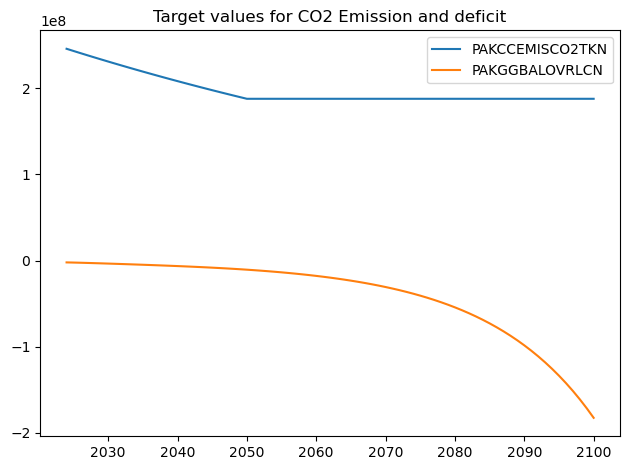

In [15]:
target.plot(title = 'Target values for CO2 Emission and deficit');

## Define instruments

The instruments to be used are the **carbon tax** and **government spending on goods and services**.  To find the mnemonics for these variables a search is done over the descriptions of the variables, first over the carbon tax:

In [16]:
mpak['!*Carbon*'].des

PAKGGREVEMISCN : Revenues (Subsidies if negative) from carbon


A separate search is done to identify the government spending variable to be used as an instrument. It makes sense to use a variable which has a fairly direct impact on the government deficit.

In [17]:
mpak['!*expenditure*on*capital*'].des

Error: The variable specification:"!*expenditure*on*capital*" did not generate any matches


<function modelvis.DummyVis.__getattr__.<locals>.dummy_method(*args, **kwargs)>

For the purposes of this experiment the `PAKGGEXPGNFSCN_A` variable (the add-factor for the government spending on goods and services equation) is selected.

In [18]:
instruments = [['PAKGGREVCO2CER','PAKGGREVCO2GER', 'PAKGGREVCO2OER'],
               'PAKGGEXPGNFSCN_A']

In total there are two instruments and two targets, which satisfies the constraint that there must be **exactly  as many instruments as targets**. 
 

## Now solve the problem: 

Now we have a dataframe with target values and a list of instrument variables. We are ready to solve the problem. 

In [19]:
%%time
_ = mpak.invert(baseline,                  # Invert calls the target instrument device                   
                targets = target.loc[:,: ],                   
                instruments=instruments,
                DefaultImpuls=20,              # The default impulse instrument variables 
                defaultconv=2000.0,              # Convergergence criteria for targets
                varimpulse=False,             # Changes in instruments in each iteration are carried over to the future
                nonlin=5,                    # If no convergence in 15 iteration recalculate jacobi 
                silent=1,                     # Don't show iteration output (try 1 for showing)
                delay=0,
                maxiter = 2590,
                progressbar = True)

Finding instruments :   0%|          | 0/77

CPU times: total: 26.9 s
Wall time: 44.1 s


### Make charts of emission, deficit and target variables. 
Decorate the emission chart with a line showing the target. 

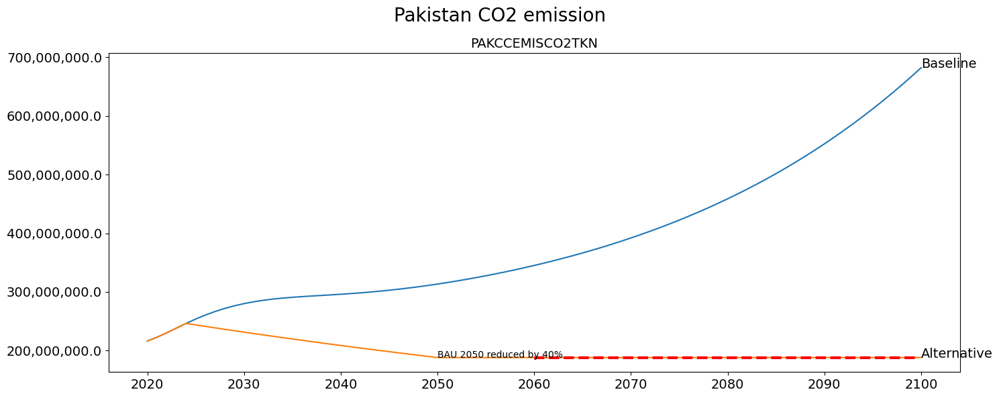

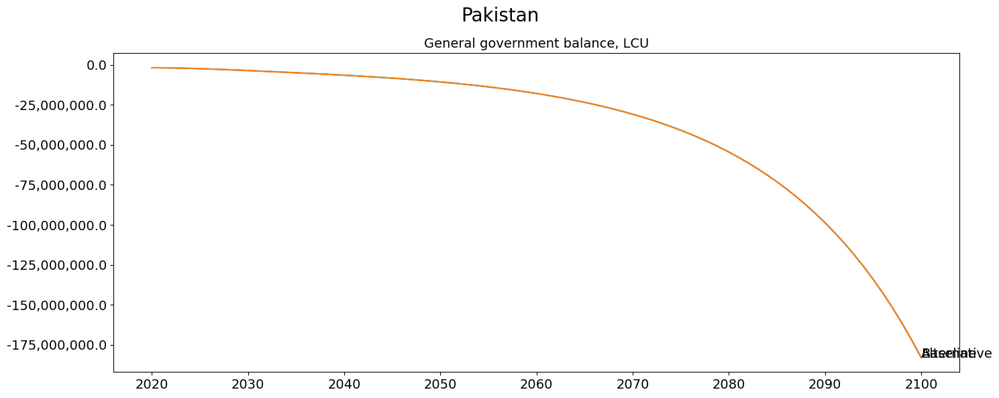

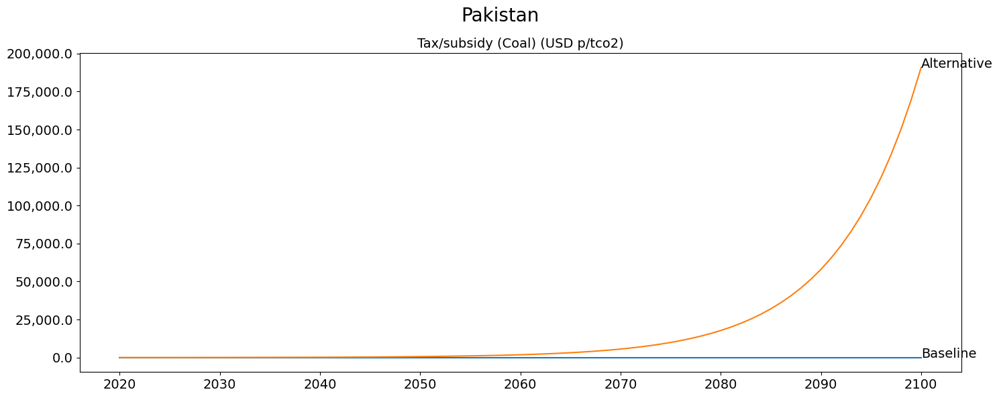

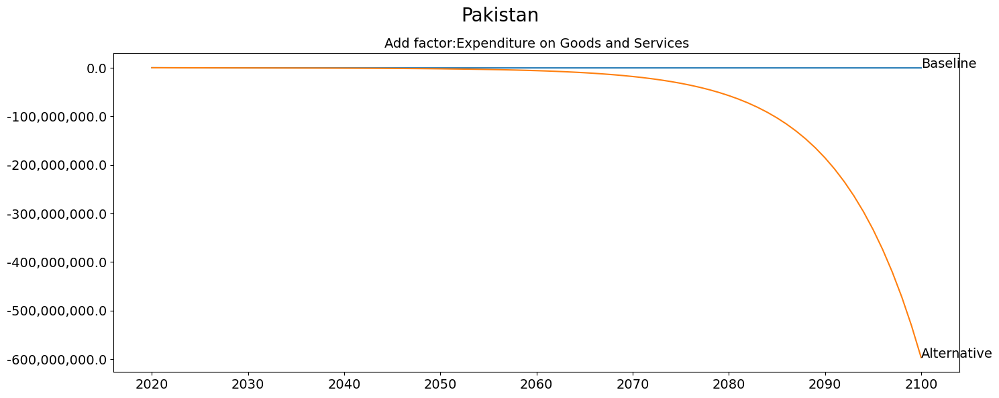

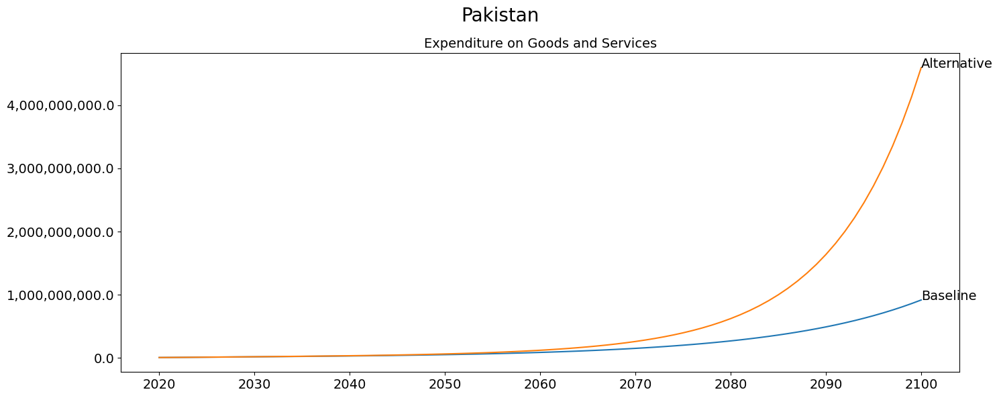

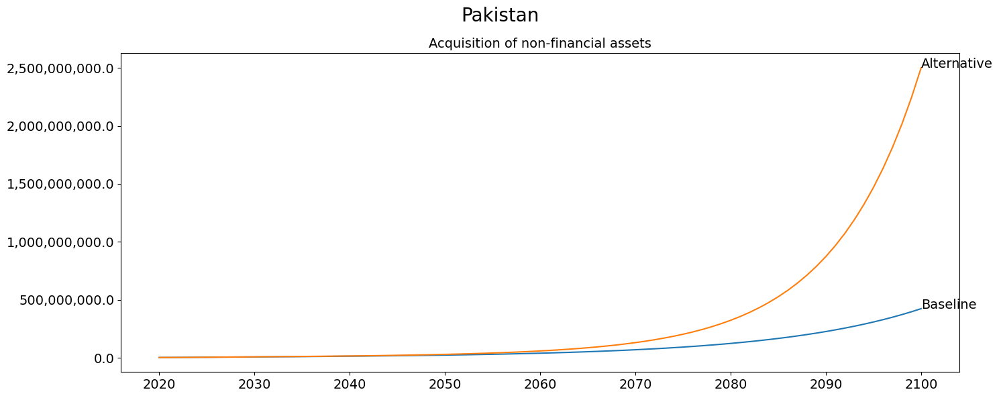

In [20]:
with mpak.set_smpl(2020,2100):    # change if you want another  timeframe 
    fig = mpak[f'PAKCCEMISCO2TKN' ].plot_alt(title='Pakistan CO2 emission') 
    fig.axes[0].axhline( target_achieved_by,
                                xmin=0.5,
                                  xmax = 0.95,
                                  linewidth=3, 
                                  color='r', ls='dashed')

    fig.axes[0].annotate(f'BAU {achieved_by} reduced by {reduction_percent}%', xy=(2050,target_achieved_by ))
    fig0 = mpak[f'PAKGGBALOVRLCN' ].plot_alt(title=f'Pakistan'); 
    fig2 = mpak[f'PAKGGREVCO2CER' ].plot_alt(title=f'Pakistan'); 
    fig3 = mpak[f'PAKGGEXPGNFSCN_A'].plot_alt(title=f'Pakistan'); 
    fig3 = mpak[f'PAKGGEXPGNFSCN' ].plot_alt(title=f'Pakistan'); 
    fig4 = mpak[f'PAKGGEXPCAPTCN' ].plot_alt(title=f'Pakistan'); 


So the carbon taxes and expenditure nessecary to acheive the targets was calculated. 

## Weighting the instruments  

When using multiple instruments for a single target, the modeler may  want to privilege changes in one instrument over another by specifying weights to attach to each.  In the example below, specific weights are attached to the instruments instructing the solver to place twice as much emphasis on adjusting the carbon tax on coal emissions (as compared with the other two carbon taxes).  

In [21]:
new_instruments =[[('PAKGGREVCO2CER',50),
                   ('PAKGGREVCO2GER', 25),
                   ('PAKGGREVCO2OER',25)],
                 'PAKGGEXPGNFSCN_A']

_ = mpak.invert(baseline,                  # Invert calls the target instrument device                   
                targets = target.loc[:,: ],                   
                instruments=new_instruments,
                DefaultImpuls=20,              # The default impulse instrument variables 
                defaultconv=2000.0,              # Convergergence criteria for targets
                varimpulse=False,             # Changes in instruments in each iteration are carried over to the future
                nonlin=5,                    # If no convergence in 15 iteration recalculate jacobi 
                silent=1,                     # Don't show iteration output (try 1 for showing)
                delay=0,
                maxiter = 2590,
                progressbar = True)

Finding instruments :   0%|          | 0/77

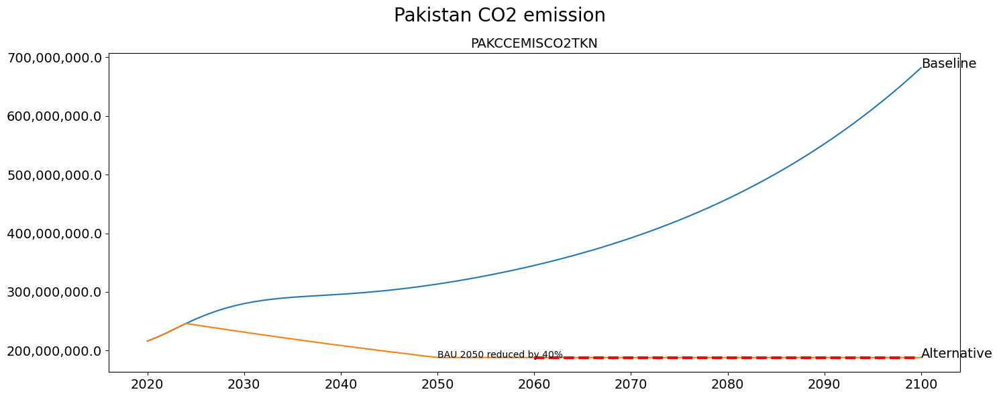

In [22]:
with mpak.set_smpl(2020,2100):    # change if you want another  timeframe 
    fig = mpak[f'PAKCCEMISCO2TKN' ].plot_alt(title='Pakistan CO2 emission') 
    fig.axes[0].axhline( target_achieved_by,
                                xmin=0.5,
                                  xmax = 0.95,
                                  linewidth=3, 
                                  color='r', ls='dashed')

    fig.axes[0].annotate(f'BAU {achieved_by} reduced by {reduction_percent}%', xy=(2050,target_achieved_by ))


Below the level of the different tax rates the last 10 years are displayed. As wished the tax on coal is larger than the tax on gas and oil. 

In [23]:
 mpak['PAKGGREVCO2CER PAKGGREVCO2GER PAKGGREVCO2OER' ].rename().df.loc[2090:2100]

,Tax/subsidy (Coal) (USD p/tco2),Tax/subsidy (Gas) (USD p/tco2),Tax/subsidy (Oil) (USD p/tco2)
2090,111592.771141,55758.159606,55790.449840
2091,125802.767875,62863.157973,62895.448207
2092,141825.493284,70874.520678,70906.810911
2093,159890.430366,79906.989219,79939.279453
2094,180257.161947,90090.355009,90122.645243
2095,203216.626361,101570.087216,101602.377450
2096,229097.685447,114510.616759,114542.906993
2097,258269.006390,129096.277231,129128.567464
2098,291147.128225,145535.338148,145567.628382
2099,328198.748479,164061.148275,164093.438509


## Targeting background

The concept of targets and instruments in economic modeling was introduced by {cite:t}`tinbergen_economic_1967`

When solving a targeting problem it can be thought as follows: From the generic description of a model: $\textbf{y}_t= \textbf{F}(\textbf{x}_{t})$. Here $\textbf{x}_{t}$ are all predetermined variables - lagged endogenous and all exogenous variables. 


Think of a condensed model ($\textbf{G}$) with a few endogenous variables ($\bar{\textbf{y}}_t$):
the targets and a few exogenous variables($\bar{\textbf{x}}_{t}$): the instrument variables. All the rest of the predetermined variables are fixed:  
$\bar{\textbf{y}}_t= \textbf{G}(\bar{\textbf{x}}_{t})$

In some models the result depends on the level of exogenous variables with a lag. For instance in a disease spreading model, the *number of infected* on a day depends on the *probability of transmission* some days before. If the *probability of transmission* is the instrument and the *number of infected* is the target. Therefor it can be useful to allow a **delay**, when finding the instruments. In this case we want to look at  $\textbf{y}_t= \textbf{F}(\textbf{x}_{t-delay})$ 


If we invert G we have a model where  instruments are functions of targets:
$\bar{\textbf{x}_{t-delay}}= \textbf{G}^{-1}(\bar{\textbf{y}_{t}})$. Then all we have to do is to find
$\textbf{G}^{-1}(\bar{\textbf{y}_{t}})$


For most models $\bar{\textbf{x}}_{t-delay}= \textbf{G}^{-1}(\bar{\textbf{y}_{t}})$ do not have a nice close form solution. However it can be solved numerically. We  turn to **Newton–Raphson** method.

So $\bar{\textbf{x}}_{t-delay}= \textbf{G}^{-1}(\bar{\textbf{y}_{t}^*})$ will be found using :

for $k$ = 1 to convergence  

>$\bar{\textbf{x}}_{t-delay,end}^k= \bar{\textbf{x}}_{t-delay,end}^{k-1}+ \textbf{J}^{-1}_t \times (\bar{\textbf{y}_{t}^*}-
\bar{\textbf{y}_{t}}^{k-1})$

>$\bar{\textbf{y}}_t^{k}= \textbf{G}(\bar{\textbf{x}}_{t-delay}^{k})$

convergence: $\mid\bar{\textbf{y}_{t}^*}-
\bar{\textbf{y}_{t}}
\mid\leq \epsilon$

Now we just need to find: 

$\textbf{J}_t = \frac{\partial \textbf{G} }{\partial \bar{\textbf{x}}_{t-delay}}$

ModelFlow uses numerical differentiation, as it is quite simple and fast.

$\textbf{J}_t \approx \frac{\Delta \textbf{G} }{\Delta \bar{\textbf{x}}_{t-delay}}$

That means that we should run the model one time for each instrument, and record the 
impact  on each of the targets from the , ${\Delta {x}_{t-delay}^{instrument}}$then we have $\textbf{J}_t$ 

In order for $\textbf{J}_t$ to be invertible there has to be **the same number of targets and instruments**. 

However, each instrument can be a basket of exogenous variable an they can have different impulse $\Delta$
.

\begin{equation}
\Delta x^{instrument=i} = 
\begin{bmatrix}
\Delta x^{instrument=i,variable=1} \\
\Delta x^{instrument=i,variable=2} \\
\Delta x^{instrument=i,variable=3} \\
\vdots \\
\Delta x^{instrument=i,variable=n} \\
\end{bmatrix}
\end{equation}

When a instrument changes the variables wil change and the change will be in the proportions defined by their impulse. 

You will notice that the level of $\bar{\textbf{x}}$ is updated (by  $\textbf{J}^{-1}_t \times (\bar{\textbf{y}_{t}^*}-
\bar{\textbf{y}_{t}}^{k-1})$) in all periods from $t-delay$ to $end$, where $end$ is the last timeframe in the dataframe. This is useful for many applications, where the instruments are level variable (i.e. not change variables). This is the default behavior. It can be changed.  


:::{index} single: Targeting; Tuning
:::


## Tuning the target input to get a result
Models implemented in `modelflow` can be very different, and the targeting routine `.invert` is pretty general. 
The user can't expect that targeting works out of the box. In most cases - as in this notebook - the options has to be set 
to values which fits the problem at hand. 

:::{index} single: Targeting; Impulse
:::

### impulse
The impulse has to be right. Else the jacobi matrix $\textbf{J}_t$ will be useless. As discussed above - and forgetting the bar and the delay - the term  ${\Delta \bar{\textbf{x}}_{t-delay}}$
  is used when calculating the approximate  

The size of impulse should not impact the result of the targeting function. However it can have major impact of the speed to convergence and the feasibility of the endeavor.

If a large impulse is used for a small variable $\textbf{x}+{\Delta \bar{\textbf{x}}_{t-delay}}$
  may cause the model to become unsolvable. Or the model can be so nonlinear that the $\textbf{J}_t$
  becomes irrelevant for the solution.

If a small impulse is used it can mean that $\textbf{J}_t$
  becomes very small and $\textbf{J}^{-1}_t$
  the problem becomes il conditioned (in other word the condition number  $\kappa(\textbf{J}_t)$ should not be "large") 

As mentioned the impulse can set either when defining the instruments, or as a default impulse when the `.invert` routine is called (DefaultImpuls=). 

:::{index} single: Targeting; Nonlinearity
:::

### Nonlinearity 

If the model is nonlinear it makes sense to update the jacobi matrix $\textbf{J}_t$ frequently. Using `nonlin=a number` the user determines how many iterations the same jacobi matrix could be used before 
a new one has to be calculated. 

If:
 - `nonlin=True` the jacobi will be updated every iteration 
 - `nonlin=False` the jacobi will not be updated (default) 
 - `nonlin=<a number>` the same jacobi matrix will be updated every <a number> iterations

:::{index} single: Targeting; Convergence 
:::    
    
### Convergence
    
The targeting is stopped when all target variables converge. If the values of the target variables are large. The convergence criteria should reflect that. Else targeting will take really long time.  
    
 -  `defaultconv=<a number>`

:::{index} single: Targeting; Max iterations
:::    
    
### Maximum number of iterations
The max number of iterations are managed with 
 -  `maxiter=<a number>`
    
    
If the problem is badly conditioned or the model very nonlinear it may take many iterations for Newthon-Raphson algorithm to converge. 
    
Note this is not the number of iterations for the model to converge. This is the additional Newthon-Raphson  iterations. 
    

## Defining Instruments 

Then we have to provide the instruments. This is **a list**. This list has elements.  
-  Each element in the list is an instrument. 
-  An element can be:
   - a variable name 
   - a tuple with a variable name  and the associated impulse $\Delta$
   - a inner list which defines which contains:  
        - a list of variable names. Each element in the inner list is an instrument variable 
        - a list of tupls each tuple contains a variable name and the associated impulse $\Delta$. 

The $\Delta variable$ is used in the numerical differentiation. Also if one instrument contains several variables, the proportion of each variable will be determined by the relative $\Delta  variable$. 

To make this concrete below are some  examples:

| Instrument definition | Meaning|
|--------------|---------------|
|[ 'QO_J','TG']|   Two instruments and each with one variable 
|[ ('QO_J',0.5), 'TG']| Same. QO_J is getting its own impulse (0.5)|
|[[' 'QO_J','QP_J''], 'TG']| Two instruments the first have two  variables| 
|[[('QO_J',0.5),('ORLOV',1.)],('TG',0.01)]| Same. All variables get an impulse| 

## Advanced information -  targeting class instance 
When a model calls the `.invert` method a the modelinstance  will receive an object `.t_i`. This object has been doing the 
underlying calculations. The very advanced/curious user can be interested in some of its properties. 

In [24]:
ti= mpak.t_i

### `.instruments` a list if instruments

In [25]:
ti.instruments

{0: {'name': 'PAKGGREVCO2CER,PAKGGREVCO2GER,PAKGGREVCO2OER',
  'vars': [('PAKGGREVCO2CER', 50),
   ('PAKGGREVCO2GER', 25),
   ('PAKGGREVCO2OER', 25)]},
 1: {'name': 'PAKGGEXPGNFSCN_A', 'vars': [('PAKGGEXPGNFSCN_A', 20)]}}

### `.jac` The Jacobi matrix 
This property will contain the last calculated jacobi matrix. 

In [26]:
ti.jac

,"PAKGGREVCO2CER,PAKGGREVCO2GER,PAKGGREVCO2OER",PAKGGEXPGNFSCN_A
PAKCCEMISCO2TKN,-12749.778642,0.140703
PAKGGBALOVRLCN,52170.614016,-17.867525


### `.inv` The inverted Jacobi matrix 
This property will contain the last calculated jacobi matrix. 

In [27]:
ti.inv

,PAKCCEMISCO2TKN,PAKGGBALOVRLCN
"PAKGGREVCO2CER,PAKGGREVCO2GER,PAKGGREVCO2OER",-0.000081,-6.382044e-07
PAKGGEXPGNFSCN_A,-0.236637,-5.783093e-02


And we can check if the this is really the inverted jacobi

In [28]:
ti.jac @ ti.inv

,PAKCCEMISCO2TKN,PAKGGBALOVRLCN
PAKCCEMISCO2TKN,1.000000e+00,2.327622e-17
PAKGGBALOVRLCN,4.288488e-16,1.000000e+00


### `.convergence` Convergence criteria 
This property will contain the last calculated jacobi matrix. 

In [29]:
ti.targetconv

{'PAKCCEMISCO2TKN': 2000.0, 'PAKGGBALOVRLCN': 2000.0}

### `.targets` The targets  

In [30]:
ti.targets

,PAKCCEMISCO2TKN,PAKGGBALOVRLCN
2024,2.461271e+08,-2.204518e+06
2025,2.435898e+08,-2.389814e+06
2026,2.410785e+08,-2.599298e+06
2027,2.385932e+08,-2.826544e+06
2028,2.361335e+08,-3.066595e+06
...,...,...
2096,1.879956e+08,-1.424492e+08
2097,1.879956e+08,-1.515777e+08
2098,1.879956e+08,-1.613295e+08
2099,1.879956e+08,-1.717491e+08


## .jacob() Caculate the jacobi matrix
This method can calculate the Jacobi matrix in any year. below find the Jacobi in the start and the end of the simulation

In [31]:
show2025 = ti.jacobi(2025,0)
print(show2025.to_string(float_format=lambda x: f'{x:.2f}'))

                 PAKGGREVCO2CER,PAKGGREVCO2GER,PAKGGREVCO2OER  PAKGGEXPGNFSCN_A
PAKCCEMISCO2TKN                                  -44402879.70             89.52
PAKGGBALOVRLCN                                      117373.13            -18.51


In [32]:
show2100 = ti.jacobi(2100,0)
print(show2100.to_string(float_format=lambda x: f'{x:.2f}'))

                 PAKGGREVCO2CER,PAKGGREVCO2GER,PAKGGREVCO2OER  PAKGGEXPGNFSCN_A
PAKCCEMISCO2TKN                                     -12749.78              0.14
PAKGGBALOVRLCN                                       52170.61            -17.87


Not surprising - considered the expansion of the economy  - the impact of the impulse is quite smaller in the  last year than in the first. This also explains why it takes many iterations for the 
targeting to converge in the later years. 